In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
from matplotlib import style
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df_train = pd.read_csv('../dataset/train.csv')
df_test = pd.read_csv('../dataset/test.csv')

In [3]:
print('Train Shape {}'.format(df_train.shape))
print('Test shape {}'.format(df_test.shape))

Train Shape (8523, 12)
Test shape (5681, 11)


In [4]:
df_train.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


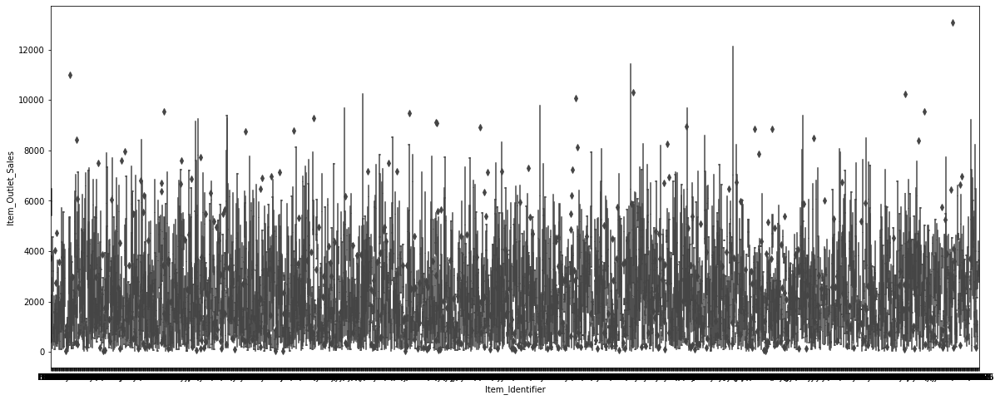

In [6]:
plt.figure(figsize=(20,8))
sns.boxplot(x= 'Item_Identifier' , y= 'Item_Outlet_Sales' , data = df_train)
plt.show()

In [17]:
df_train.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
MRP_Per_Unit                 1463
Year                            0
dtype: int64

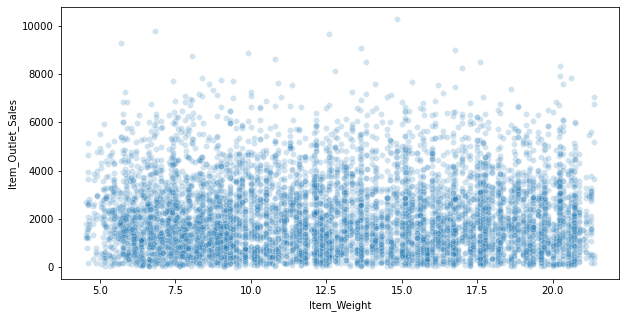

In [11]:
# let's check the relationship between "Item_Weight" and "Item_Outlet_Sales"
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'Item_Weight' , y = 'Item_Outlet_Sales' , data= df_train , alpha = 0.2)
plt.show()

&lt;Figure size 720x360 with 0 Axes&gt;

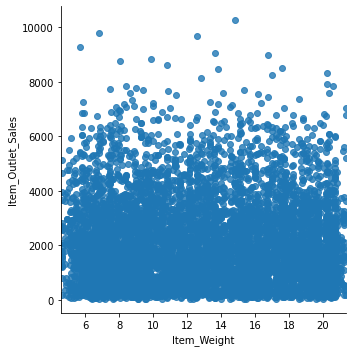

In [12]:
plt.figure(figsize=(10,5))
sns.lmplot(x = 'Item_Weight' , y = 'Item_Outlet_Sales' , data= df_train)
plt.show()

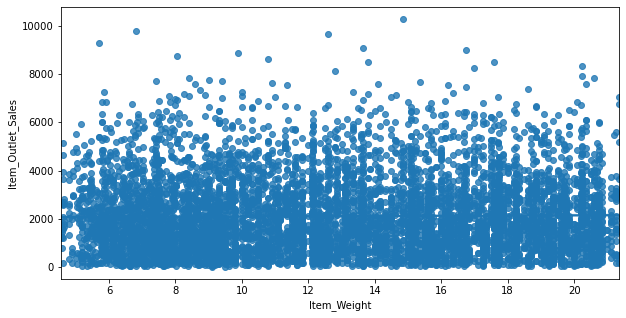

In [10]:
plt.figure(figsize=(10,5))
sns.regplot(x = 'Item_Weight' , y = 'Item_Outlet_Sales' , data= df_train)
plt.show()

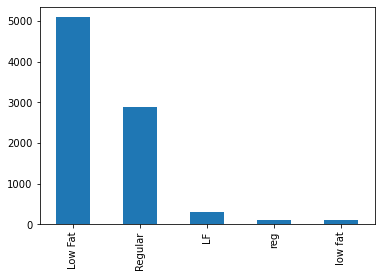

In [13]:
df_train.Item_Fat_Content.value_counts().plot.bar()
plt.show()

In [17]:
map_dict = {
        'Low Fat' : 'Low Fat',
        'LW' : 'Low Fat',
        'low fat' : 'Low Fat',
        'Regular' : 'Regular',
        'reg' : 'Regular'
    }
df_train.loc[: , 'Item_Fat_Content'] = df_train['Item_Fat_Content'].map(map_dict)

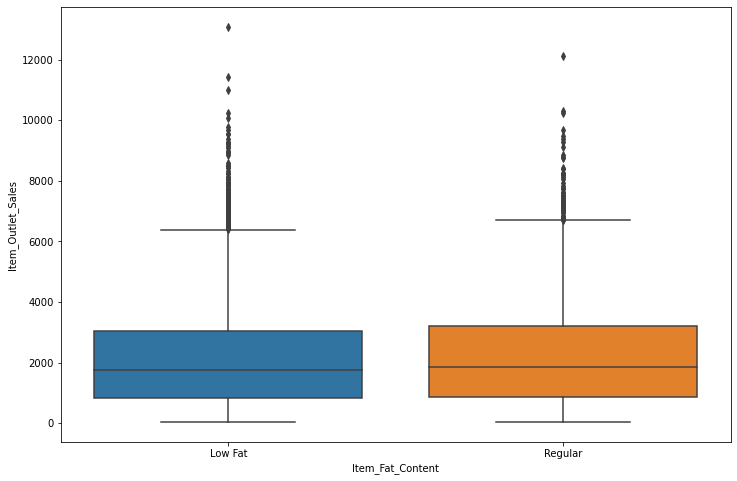

In [19]:
plt.figure(figsize=(12,8))
sns.boxplot(x = "Item_Fat_Content" , y= 'Item_Outlet_Sales' , data = df_train)
plt.show()

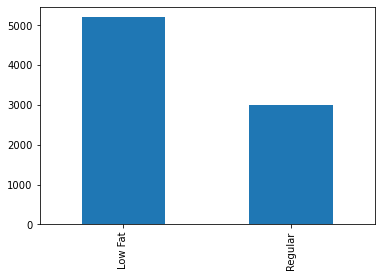

In [18]:
df_train.Item_Fat_Content.value_counts().plot.bar()
plt.show()

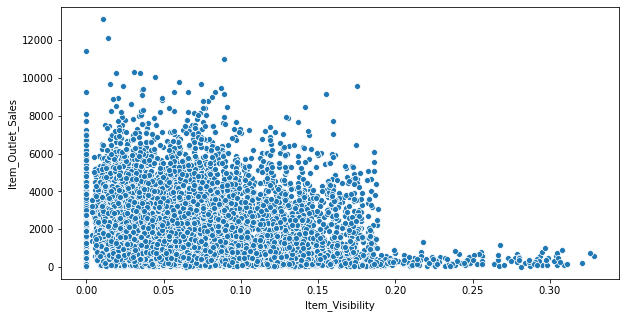

In [20]:
# checkig for the relationship between "Item_Visibilty" and "Item_Outlet_Sales"
plt.figure(figsize=(10,5))
sns.scatterplot(x= 'Item_Visibility' , y= 'Item_Outlet_Sales' , data = df_train)
plt.show()

&lt;Figure size 1080x360 with 0 Axes&gt;

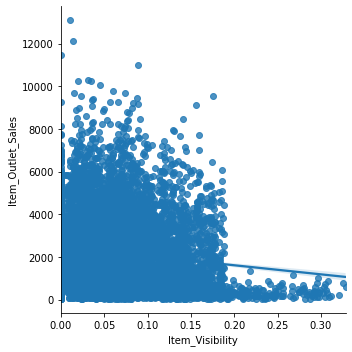

In [22]:
plt.figure(figsize= (15,5))
sns.lmplot(x= 'Item_Visibility' , y='Item_Outlet_Sales' ,  data = df_train)
plt.show()

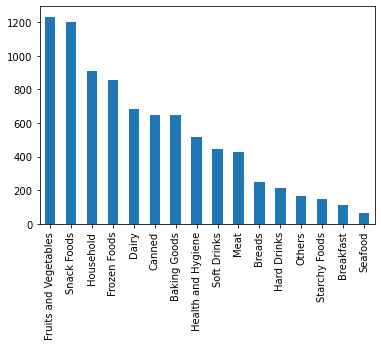

In [23]:
df_train.Item_Type.value_counts().plot.bar()
plt.show()

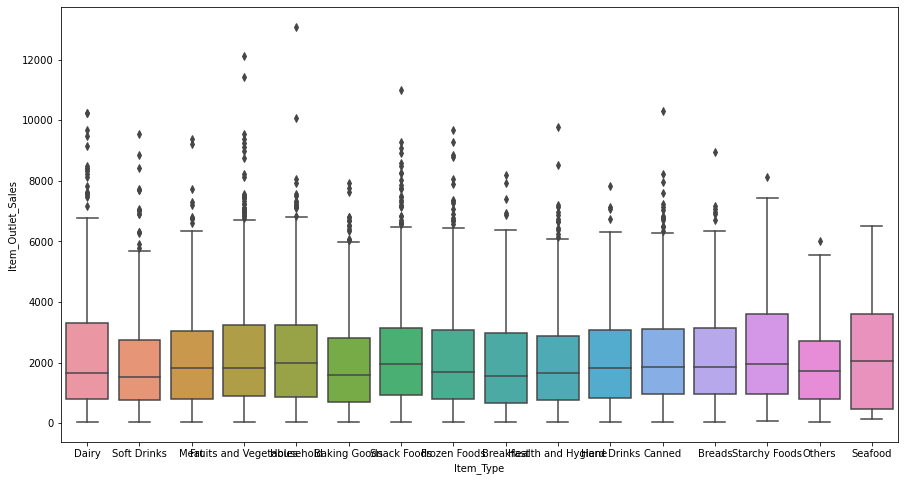

In [24]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Item_Type' , y= 'Item_Outlet_Sales' , data = df_train)
plt.show()

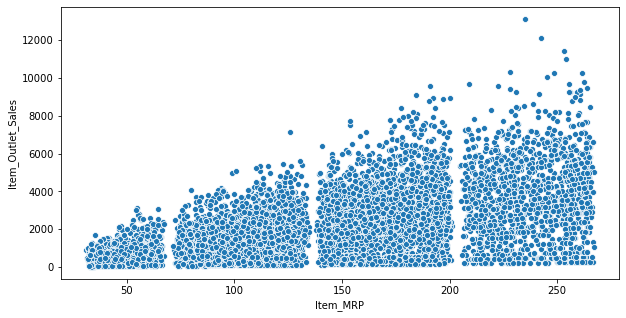

In [25]:
# relation between "Item_MRP" and "Item_Outlet_Sales"
plt.figure(figsize=(10,5))
sns.scatterplot(x= 'Item_MRP' , y='Item_Outlet_Sales' ,  data = df_train)
plt.show()

&lt;Figure size 1200x400 with 0 Axes&gt;

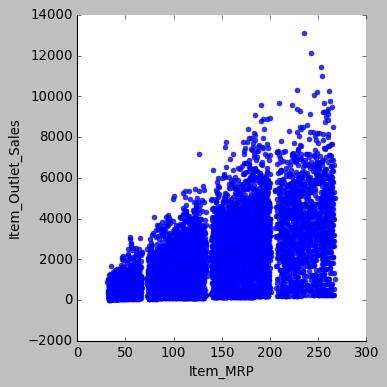

In [27]:
style.use('classic')
plt.figure(figsize=(15,5))
sns.lmplot(x = 'Item_MRP' , y='Item_Outlet_Sales' ,  data= df_train)
plt.show()

In [5]:
df_train.loc[:, 'MRP_Per_Unit'] = df_train['Item_MRP'] / df_train['Item_Weight']

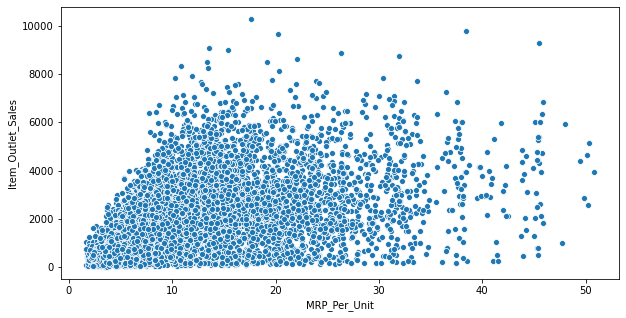

In [6]:
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'MRP_Per_Unit' , y ='Item_Outlet_Sales' , data = df_train)
plt.show()

&lt;Figure size 1080x576 with 0 Axes&gt;

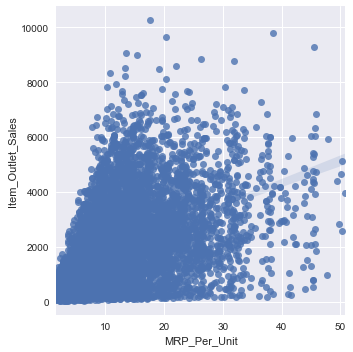

In [8]:
style.use('seaborn')
plt.figure(figsize=(15,8))
sns.lmplot(x = 'MRP_Per_Unit' , y ='Item_Outlet_Sales' , data = df_train)
plt.show()

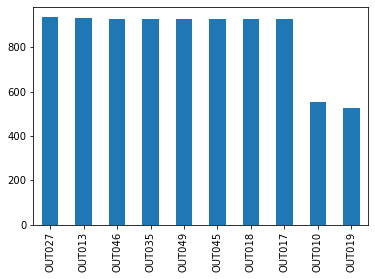

In [3]:
df_train.Outlet_Identifier.value_counts().plot.bar()
plt.show()

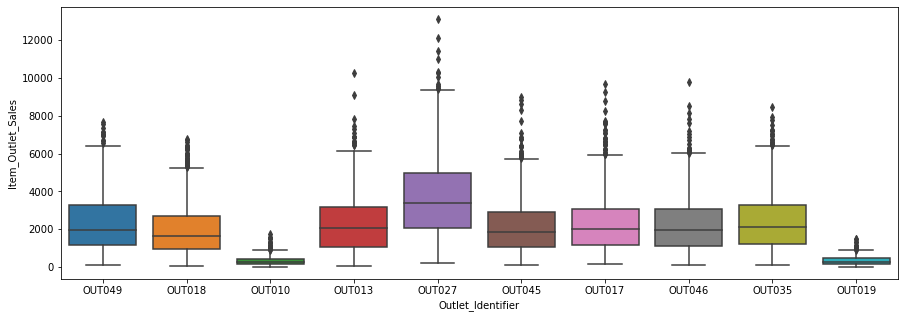

In [4]:
plt.figure(figsize=(15,5))
sns.boxplot(x = 'Outlet_Identifier' , y = 'Item_Outlet_Sales' ,  data = df_train)
plt.show()

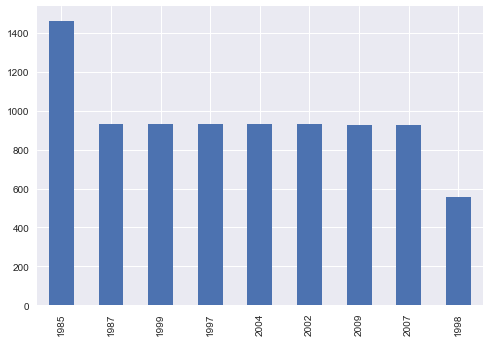

In [10]:
df_train.Outlet_Establishment_Year.value_counts().plot.bar()
plt.show()

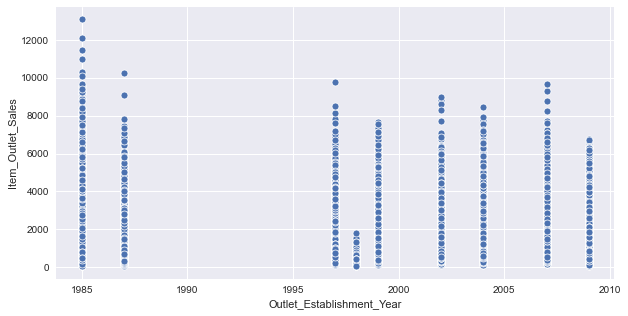

In [11]:
plt.figure(figsize=(10,5))
sns.scatterplot(x = 'Outlet_Establishment_Year' , y= 'Item_Outlet_Sales' , data=df_train)
plt.show()

&lt;Figure size 1080x360 with 0 Axes&gt;

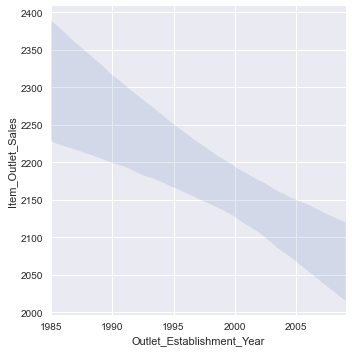

In [12]:
plt.figure(figsize=(15,5))
sns.lmplot(x = 'Outlet_Establishment_Year' , y= 'Item_Outlet_Sales' , data= df_train , scatter = False)
plt.show()

In [13]:
df_test.Outlet_Establishment_Year.max()

2009

In [14]:
df_train['Year'] = 2009 - df_train['Outlet_Establishment_Year'].values

In [15]:
df_train.Year.value_counts()

24    1463
22     932
5      930
12     930
10     930
7      929
0      928
2      926
11     555
Name: Year, dtype: int64

&lt;Figure size 1080x360 with 0 Axes&gt;

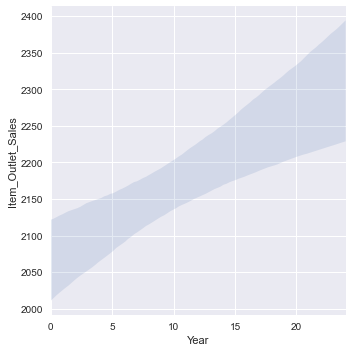

In [16]:
plt.figure(figsize=(15,5))
sns.lmplot(x = 'Year' , y= 'Item_Outlet_Sales' , data= df_train , scatter = False)
plt.show()

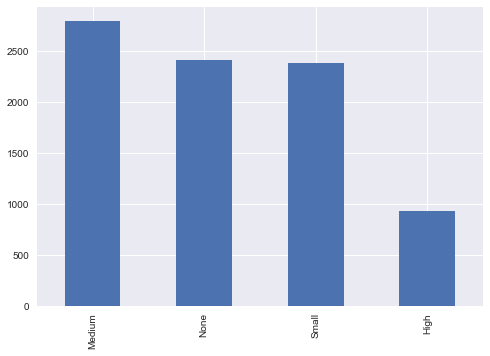

In [21]:
df_train.Outlet_Size.fillna('None' ).value_counts().plot.bar()
plt.show()

In [19]:
df_train.Outlet_Size.isnull().sum()

2410

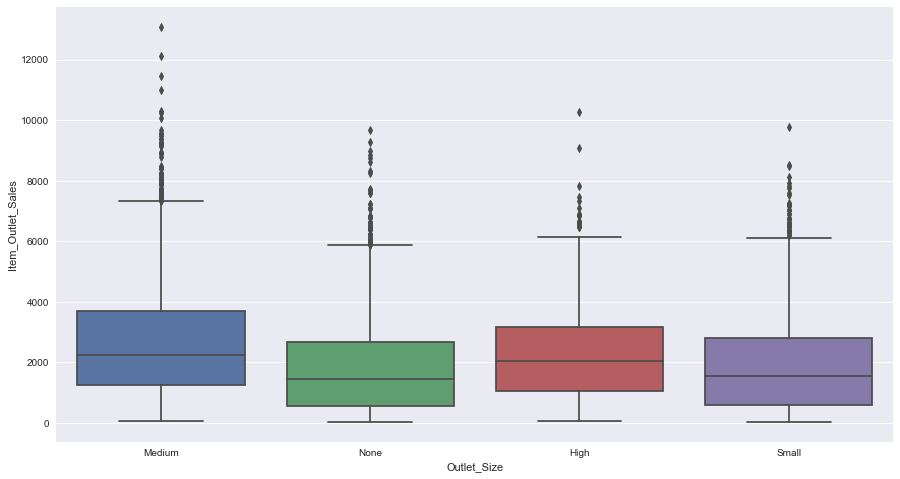

In [22]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Outlet_Size' , y= 'Item_Outlet_Sales' ,  data = df_train)
plt.show()

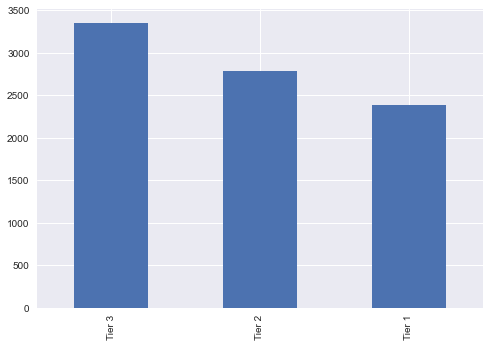

In [24]:
df_train.Outlet_Location_Type.value_counts().plot.bar()
plt.show()

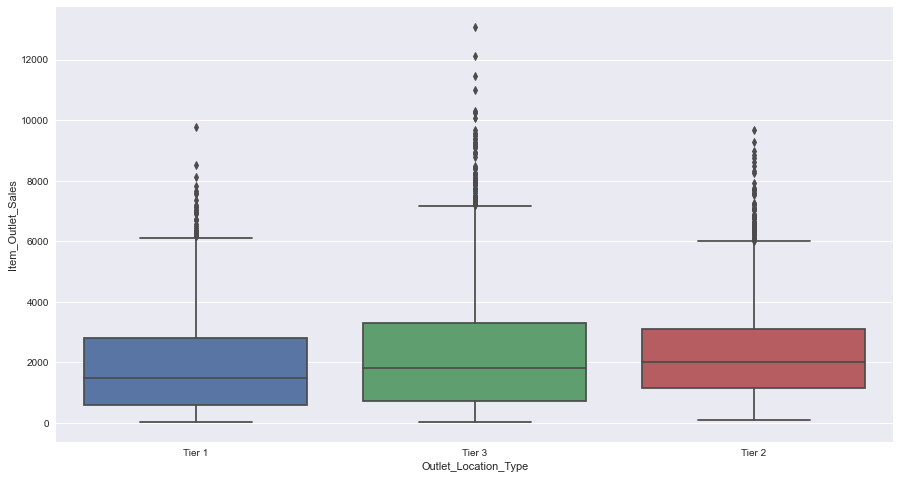

In [25]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Outlet_Location_Type' ,  y= 'Item_Outlet_Sales' , data = df_train)
plt.show()

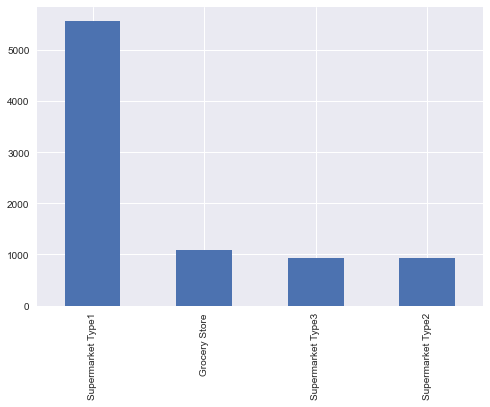

In [26]:
df_train.Outlet_Type.value_counts().plot.bar()
plt.show()

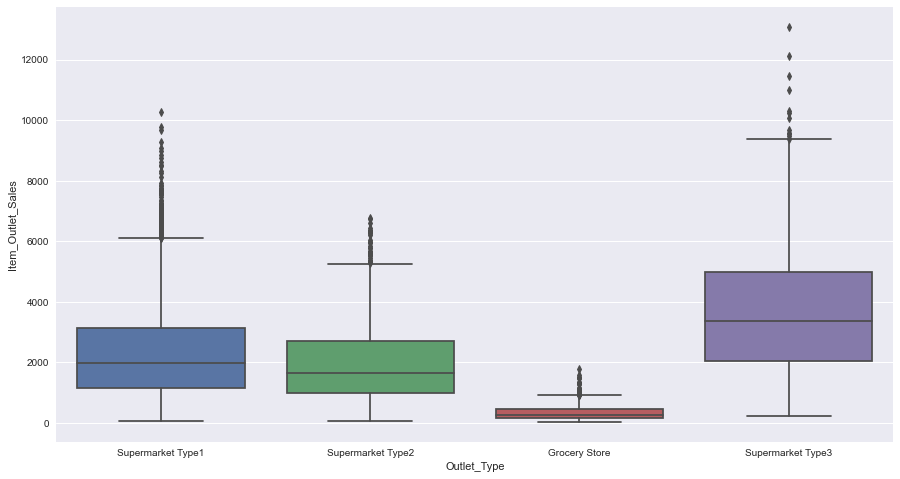

In [27]:
plt.figure(figsize=(15,8))
sns.boxplot(x = 'Outlet_Type' , y= 'Item_Outlet_Sales' ,  data = df_train)
plt.show()

In [ ]:
df_train.groupby('')